In [1]:
%%HTML
<style> code {background-color : pink !important;} </style>

In [2]:
import numpy as np
import os
import cv2
import glob
import pickle
from scipy import signal
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from scipy.signal import find_peaks_cwt
from moviepy.editor import VideoFileClip
%matplotlib inline

### 1.Camera Calibration

####### The images for camera calibration are stored in the folder called **camera_cal**

In [3]:
# setup
scale = 720/1280 # Scale the 1280 image down to 720 image
nx = 9 # the number of inside corners
ny = 6 # the number of inside corners

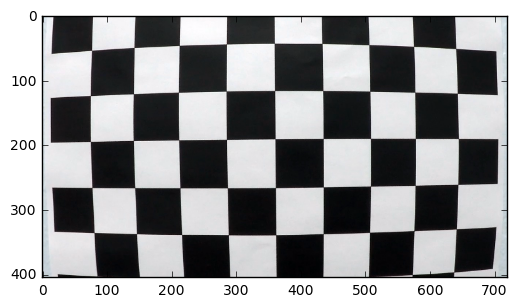

In [4]:
# load chessboard images
fname = 'camera_cal/calibration1.jpg'
img= cv2.imread(fname)
rows,cols,chs = img.shape
img = cv2.resize(img,(int(cols*scale),int(rows*scale)))
plt.imshow(img)

######## Above image has 9 coners in the x axis and 6 coners in the y axis

[ 8.  5.  0.] [ 0.  5.  0.] [ 0.  0.  0.] [ 8.  0.  0.]


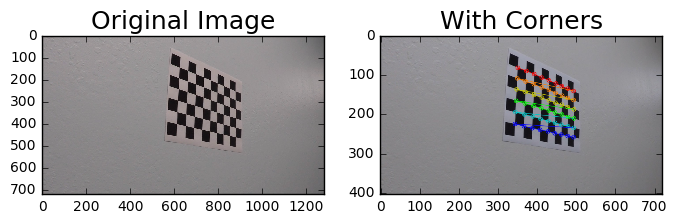

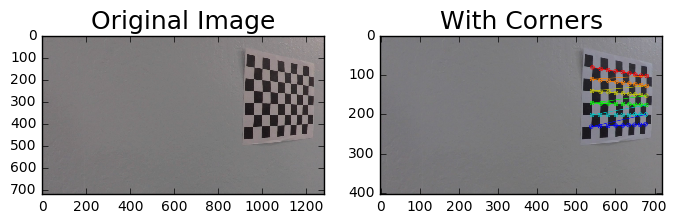

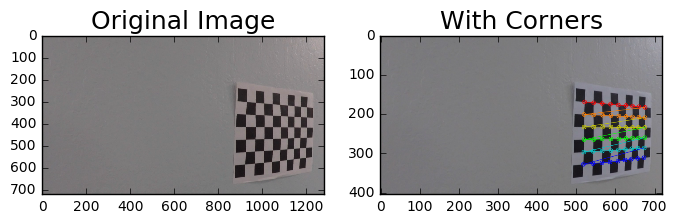

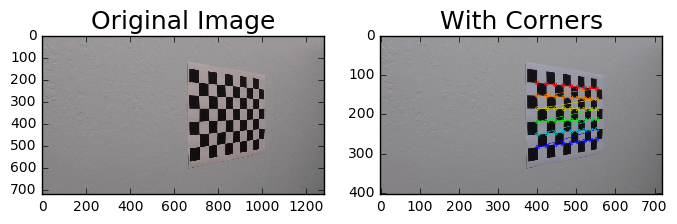

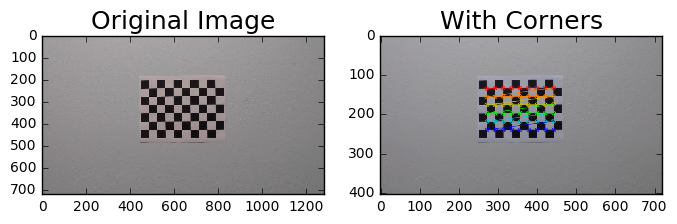

...

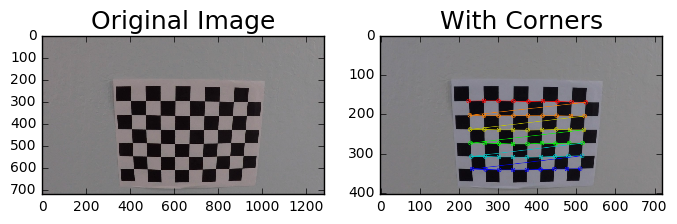

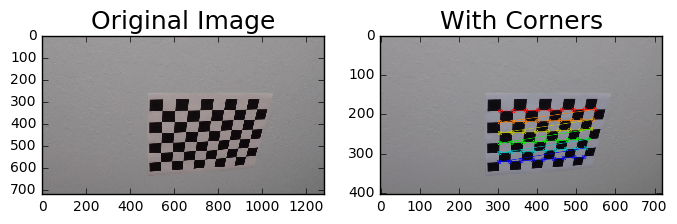

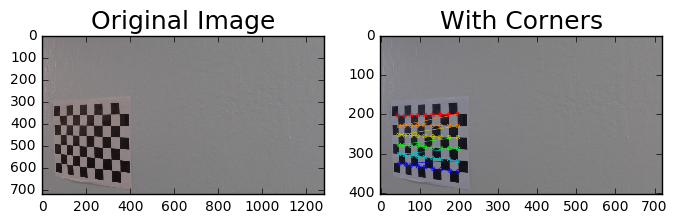

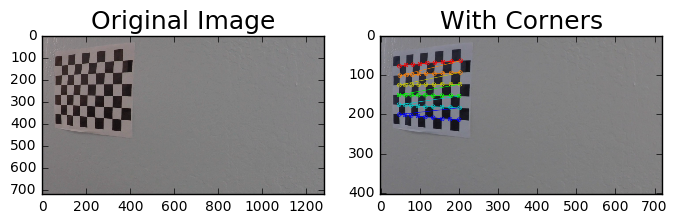

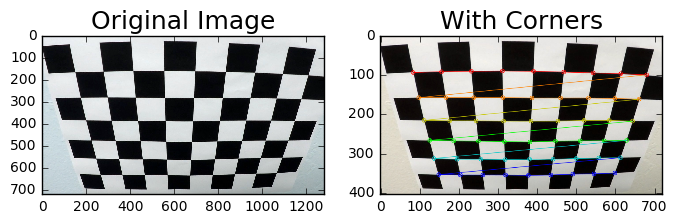

In [5]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

print(objp[-1], objp[-nx], objp[0], objp[nx-1])

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/cal*.jpg')


# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    rows,cols,chs = img.shape
    img = cv2.resize(img,(int(cols*scale),int(rows*scale)))
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        """# Draw and display the corners
        cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        #write_name = 'corners_found'+str(idx)+'.jpg'
        #cv2.imwrite(write_name, img)
        cv2.imshow('img', img)
        cv2.waitKey(500)"""
        
        #Draw and display the corners
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))
        ax1.imshow(cv2.cvtColor(mpimg.imread(fname), cv2.COLOR_BGR2RGB))
        ax1.set_title('Original Image', fontsize=18)
        ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax2.set_title('With Corners', fontsize=18)
#cv2.destroyAllWindows()

##### Ran properly so I have objpoints and imgpoints for camera calibration.

##### cv2.undistort(img, mtx, dist, None, mtx) calculates camera calibration matrix and distortion coefficients to remove distortion from an image and output the undistorted image.
### 2: Remove distortion from images
The images in **test_images** are for testing pipeline on single frame.

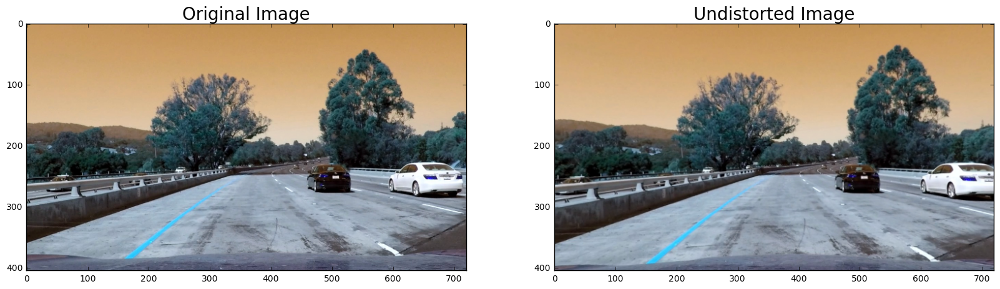

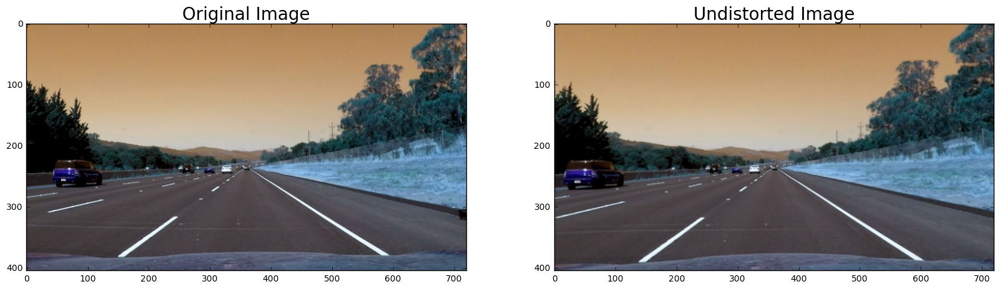

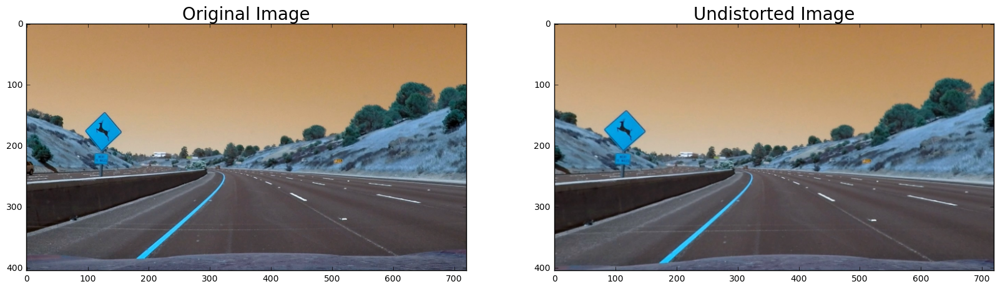

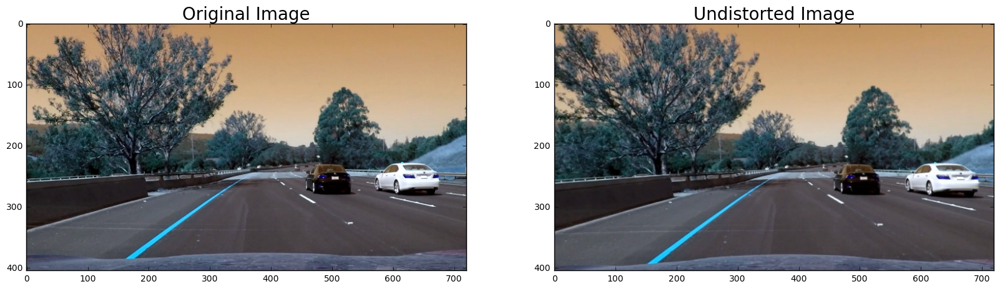

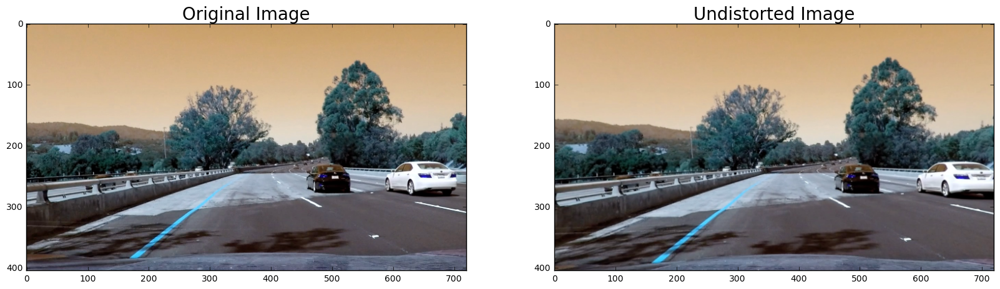

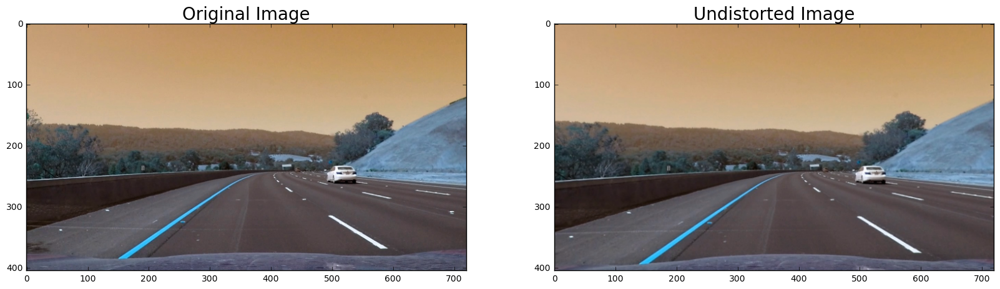

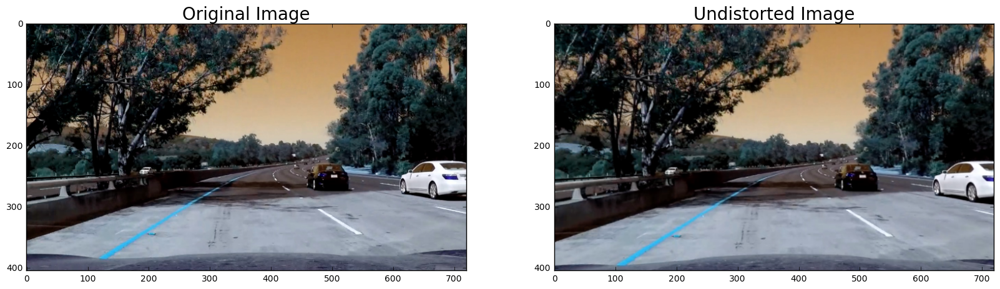

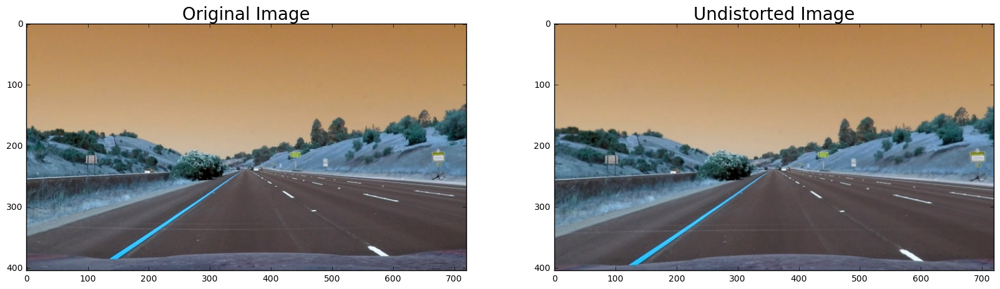

In [6]:
images = glob.glob('test_images/*.jpg')
for image in images:
    img = cv2.imread(image)
    img = cv2.resize(img,(720,405))
    img_size = (img.shape[1], img.shape[0])
    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    cv2.imwrite('calibration_wide/test_undist.jpg',dst)

    # Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
    dist_pickle = {}
    dist_pickle["mtx"] = mtx
    dist_pickle["dist"] = dist
    pickle.dump( dist_pickle, open( "wide_dist_pickle.p", "wb" ) )
    
    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(dst)
    ax2.set_title('Undistorted Image', fontsize=20)

#### 3. Color And Gradiant Threshold

In [7]:
# Read in an image and grayscale it
#image = mpimg.imread('signs_vehicles_xygrad.png')

# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
# Note: calling your function with orient='x', thresh_min=5, thresh_max=100
# should produce output like the example image shown above this quiz.
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
 
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    # 3) Take the absolute value of the derivative or gradient
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
        # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    grad_binary = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return the result
    return grad_binary

# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Calculate the magnitude 
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    # 5) Create a binary mask where mag thresholds are met
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
    #return binary_output
     # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=15, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Take the absolute value of the x and y gradients
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    # 5) Create a binary mask where direction thresholds are met
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
    #return binary_output
        # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output
# add_thresholds and return a binary image

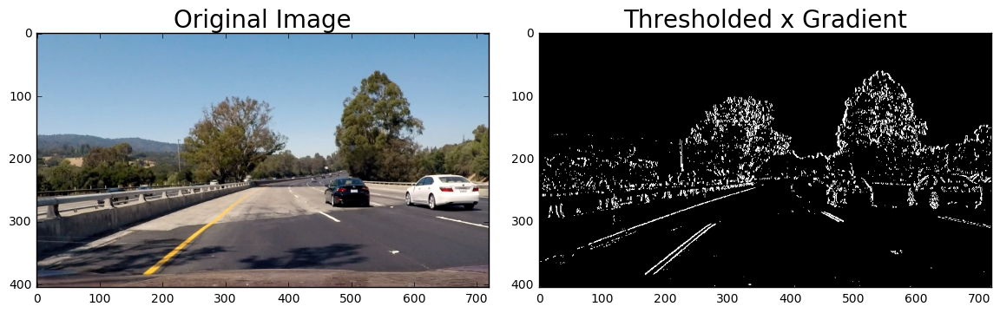

In [8]:
# Read in an image
image = mpimg.imread('test_images/test4.jpg')
image = cv2.resize(image,(720,405))
# Run the function
grad_binary = abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh=(30, 130))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Thresholded x Gradient', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

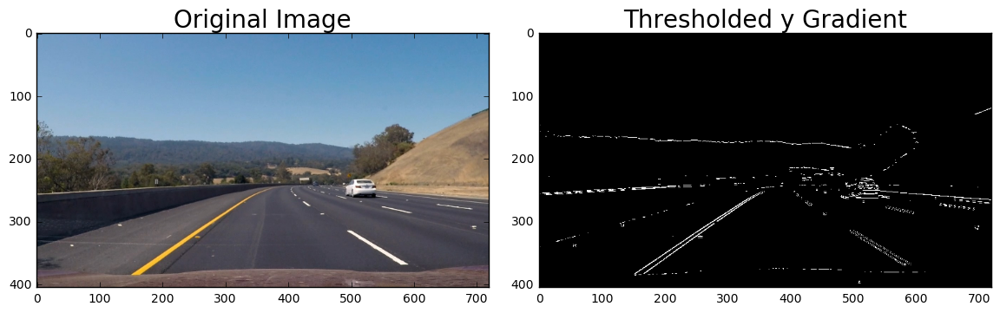

In [9]:
# Read in an image
image = mpimg.imread('test_images/test3.jpg')
image = cv2.resize(image,(720,405))
# Run the function
grad_binary = abs_sobel_thresh(image, orient='y',sobel_kernel=3, thresh=(70, 130))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Thresholded y Gradient', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

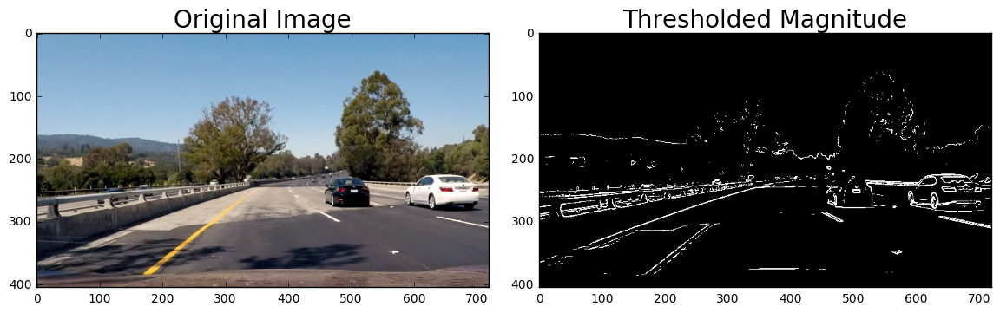

In [10]:
# Read in an image
image = mpimg.imread('test_images/test4.jpg')
image = cv2.resize(image,(720,405))
    
# Run the function
mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(80, 255))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

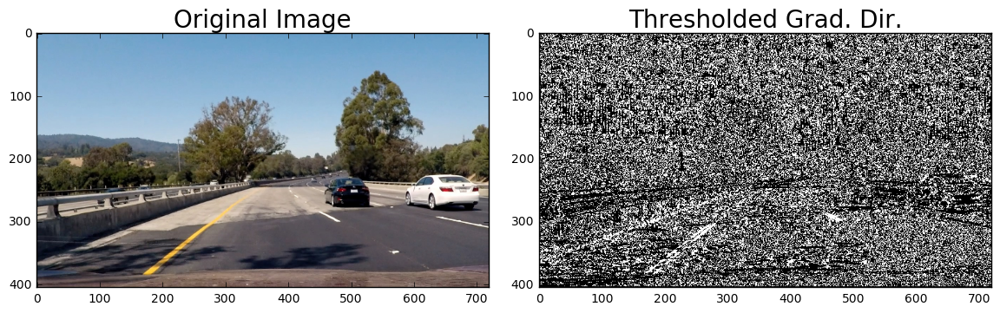

In [11]:
# Read in an image
image = mpimg.imread('test_images/test4.jpg')
image = cv2.resize(image,(720,405))
    
# Run the function
dir_binary = dir_threshold(image, sobel_kernel=3, thresh=(0.7, 1.3))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

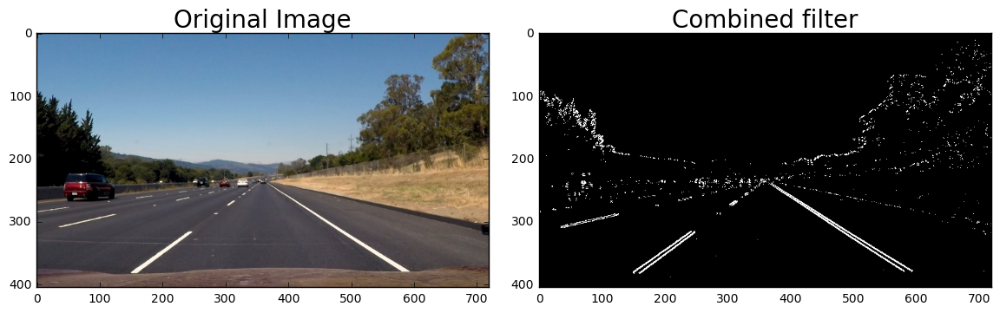

In [12]:
# Read in an image
image = mpimg.imread('test_images/straight_lines2.jpg')
image = cv2.resize(image,(720,405))


# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements

# Apply each of the thresholding functions
gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh=(30, 230))
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=3, thresh=(30, 230))
mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(80, 150))
dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.3))
combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(combined, cmap='gray')
ax2.set_title('Combined filter', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

##### based on above HLS_single() is formed 

In [13]:
# Define a function that thresholds the S-channel of HLS
def HLS_single(img, thresh=(0, 255)):
    img = np.copy(img)
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_output

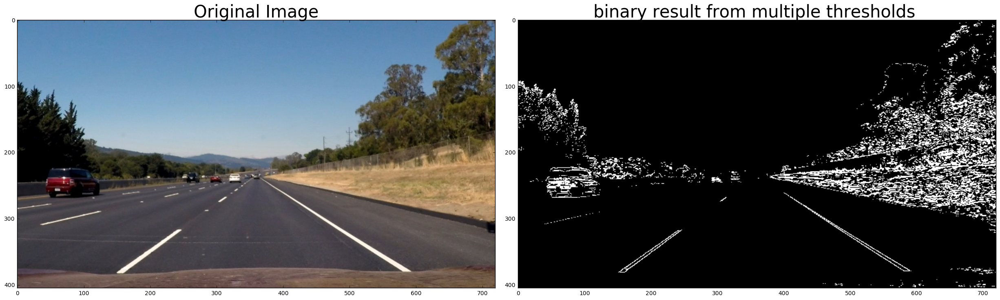

In [14]:
#image = cv2.resize(image,(720,405))
#gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements
     
# Apply each of the thresholding functions
gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(10,90))
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(10,90))
mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(80,255))
dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.3))
hls_binary = HLS_single(image,thresh=(70, 255))
combined = np.zeros_like(dir_binary)
#combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
combined[((grady == 1) & (grady == 1) & (grady == 1) & (hls_binary == 1)) | ((mag_binary == 1) & (dir_binary == 1) & (hls_binary == 1))] = 1
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(combined, cmap='gray')
ax2.set_title('binary result from multiple thresholds ', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#### 4: Perspective Transform

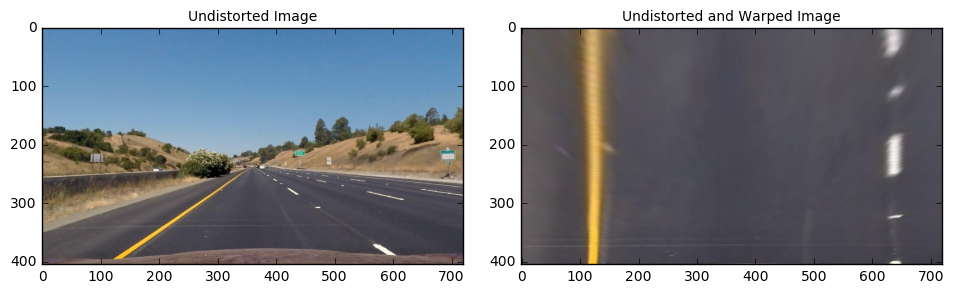

In [15]:
img = cv2.imread('test_images/straight_lines1.jpg')
img = cv2.resize(img, (720, 405))
img_size = (img.shape[1], img.shape[0])
undist = cv2.undistort(img, mtx, dist, None, mtx)
img= cv2.GaussianBlur(img, (3,3), 0)
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
apex, apey = 360, 258
offset = 0
offset_far = 50
offset_near = 10
src = np.float32([[308,260],[408,260],[50,380],[650,380]])
dst = np.float32([[0,0],[720,0],[0,405],[720,405]])
M = cv2.getPerspectiveTransform(src, dst)
warped = cv2.warpPerspective(undist, M, img_size)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 6))
f.tight_layout()
ax1.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
ax1.set_title('Undistorted Image', fontsize=10)
ax2.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
ax2.set_title('Undistorted and Warped Image', fontsize=10)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

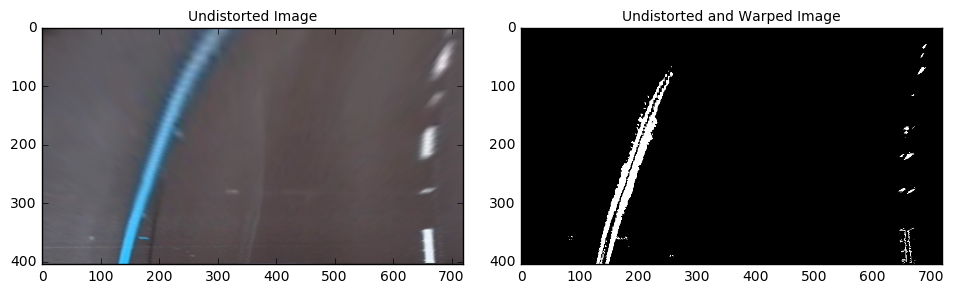

In [16]:
img = cv2.imread('test_images/test3.jpg')
img = cv2.resize(img, (720, 405))
img_size = (img.shape[1], img.shape[0])
undist = cv2.undistort(img, mtx, dist, None, mtx)
img= cv2.GaussianBlur(img, (3,3), 0)
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
src = np.float32([[310,255],[410,255],[50,380],[650,380]])
dst = np.float32([[0,0],[720,0],[0,405],[720,405]])
M = cv2.getPerspectiveTransform(src, dst)
warped = cv2.warpPerspective(undist, M, img_size)
ksize=3
gradx = abs_sobel_thresh(warped, orient='x', sobel_kernel=ksize, thresh=(10, 230))
grady = abs_sobel_thresh(warped, orient='y', sobel_kernel=ksize, thresh=(10, 230))
mag_binary = mag_thresh(warped, sobel_kernel=ksize, mag_thresh=(30, 150))
dir_binary = dir_threshold(warped, sobel_kernel=ksize, thresh=(0.7, 1.3))
hls_binary = HLS_single(warped,thresh=(90, 255))
combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (hls_binary == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 6))
f.tight_layout()
ax1.imshow(warped)
ax1.set_title('Undistorted Image', fontsize=10)
ax2.imshow(combined,cmap='gray')
ax2.set_title('Undistorted and Warped Image', fontsize=10)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

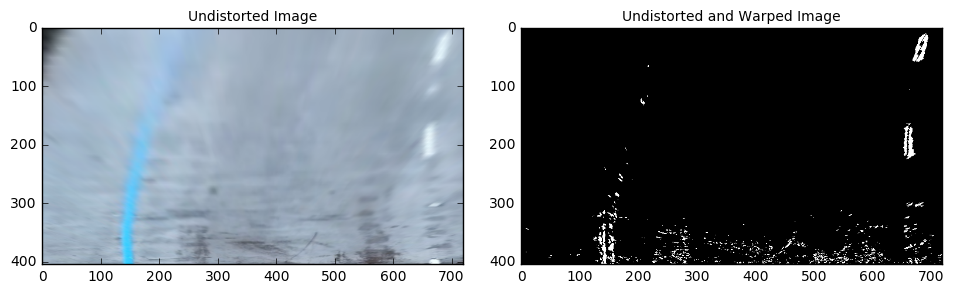

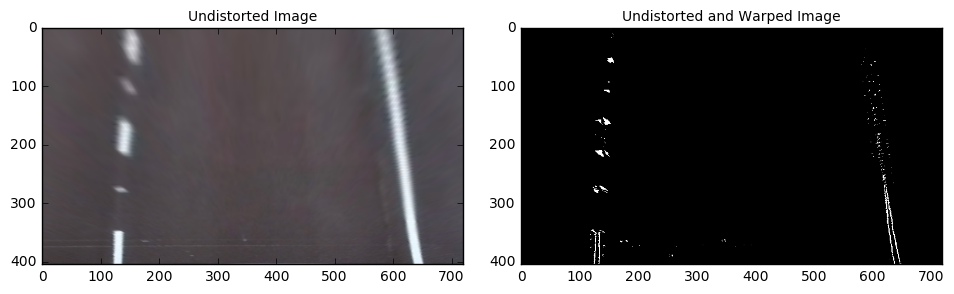

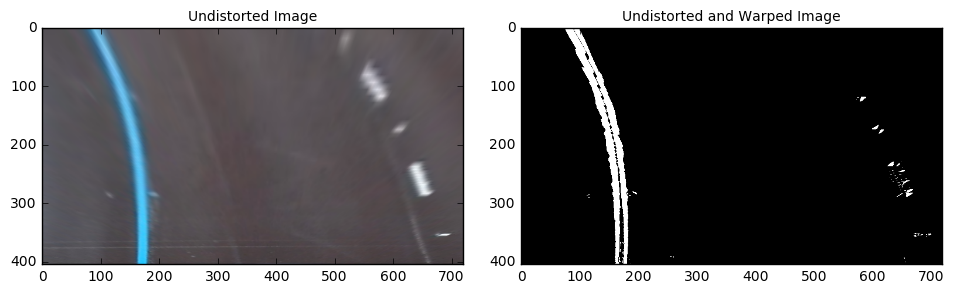

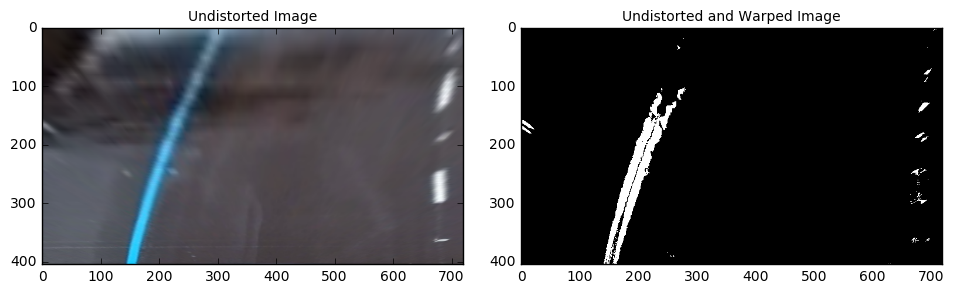

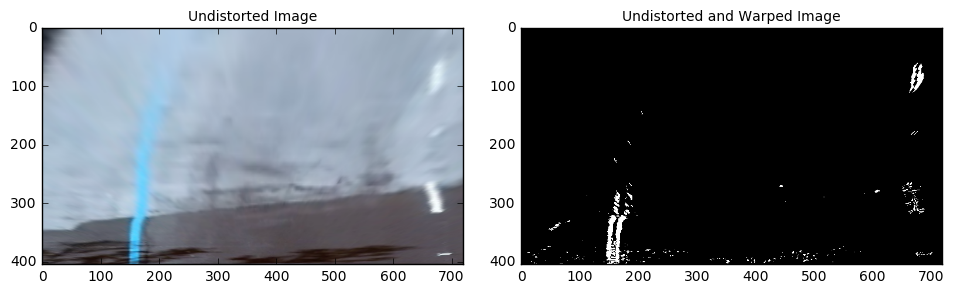

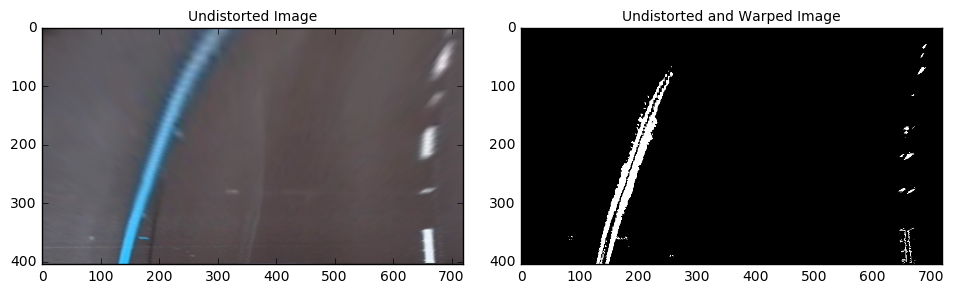

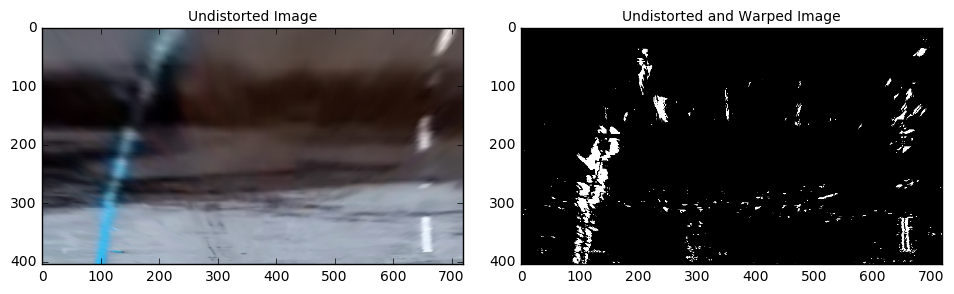

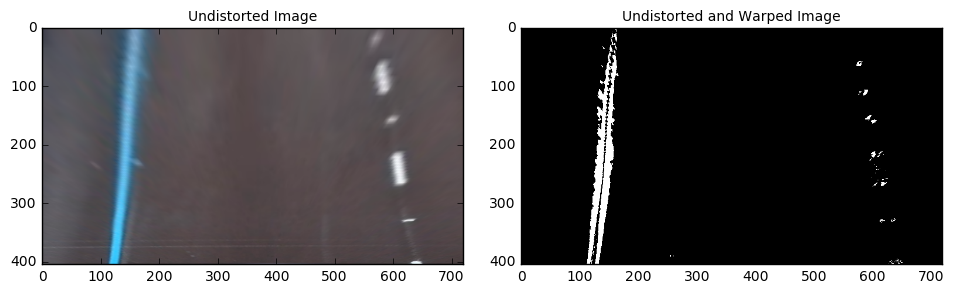

In [17]:
images = glob.glob('test_images/*.jpg')
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    img = cv2.resize(img, (720, 405))
    img_size = (img.shape[1], img.shape[0])
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    img= cv2.GaussianBlur(img, (3,3), 0)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    src = np.float32([[310,255],[410,255],[50,380],[650,380]])
    dst = np.float32([[0,0],[720,0],[0,405],[720,405]])
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(undist, M, img_size)
    ksize=3
    gradx = abs_sobel_thresh(warped, orient='x', sobel_kernel=ksize, thresh=(10, 230))
    grady = abs_sobel_thresh(warped, orient='y', sobel_kernel=ksize, thresh=(10, 230))
    mag_binary = mag_thresh(warped, sobel_kernel=ksize, mag_thresh=(30, 150))
    dir_binary = dir_threshold(warped, sobel_kernel=ksize, thresh=(0.7, 1.3))
    hls_binary = HLS_single(warped,thresh=(90, 255))
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (hls_binary == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 6))
    f.tight_layout()
    ax1.imshow(warped)
    ax1.set_title('Undistorted Image', fontsize=10)
    ax2.imshow(combined,cmap='gray')
    ax2.set_title('Undistorted and Warped Image', fontsize=10)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

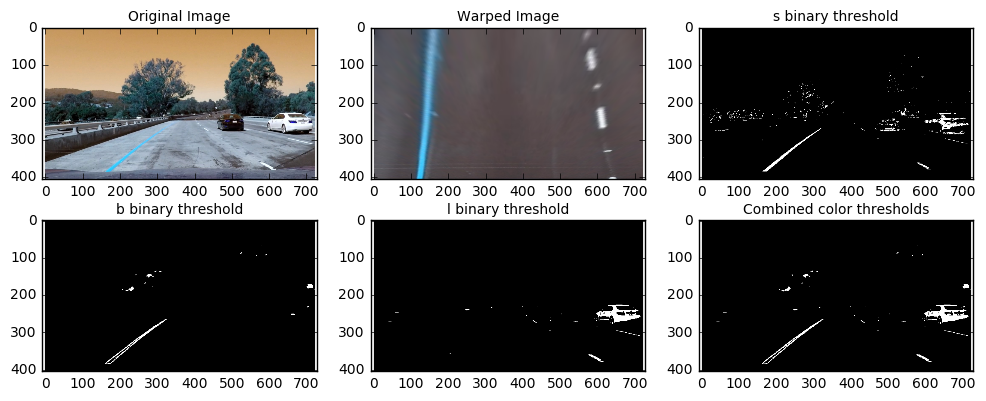

In [18]:
img = cv2.imread('test_images/test1.jpg')
img = cv2.resize(img, (720, 405))
s_channel = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)[:,:,2]
l_channel = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)[:,:,0]
b_channel = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)[:,:,2]   
# Threshold color channel
s_thresh_min = 180
s_thresh_max = 255
s_binary = np.zeros_like(s_channel)
s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
b_thresh_min = 155
b_thresh_max = 200
b_binary = np.zeros_like(b_channel)
b_binary[(b_channel >= b_thresh_min) & (b_channel <= b_thresh_max)] = 1
l_thresh_min = 225
l_thresh_max = 255
l_binary = np.zeros_like(l_channel)
l_binary[(l_channel >= l_thresh_min) & (l_channel <= l_thresh_max)] = 1

#color_binary = np.dstack((u_binary, s_binary, l_binary))
combined_binary = np.zeros_like(s_binary)
combined_binary[(l_binary == 1) | (b_binary == 1)] = 1

f, ((ax1, ax2, ax3), (ax4,ax5, ax6)) = plt.subplots(2, 3, sharey='col', sharex='row', figsize=(10,4))
f.tight_layout()
ax1.set_title('Original Image', fontsize=10)
ax1.imshow(img)
ax2.set_title('Warped Image', fontsize=10)
ax2.imshow(warped)
ax3.set_title('s binary threshold', fontsize=10)
ax3.imshow(s_binary, cmap='gray')
ax4.set_title('b binary threshold', fontsize=10)
ax4.imshow(b_binary, cmap='gray')
ax5.set_title('l binary threshold', fontsize=10)
ax5.imshow(l_binary, cmap='gray')
ax6.set_title('Combined color thresholds', fontsize=10)
ax6.imshow(combined_binary, cmap='gray')

##### 5.    Detect lane lines

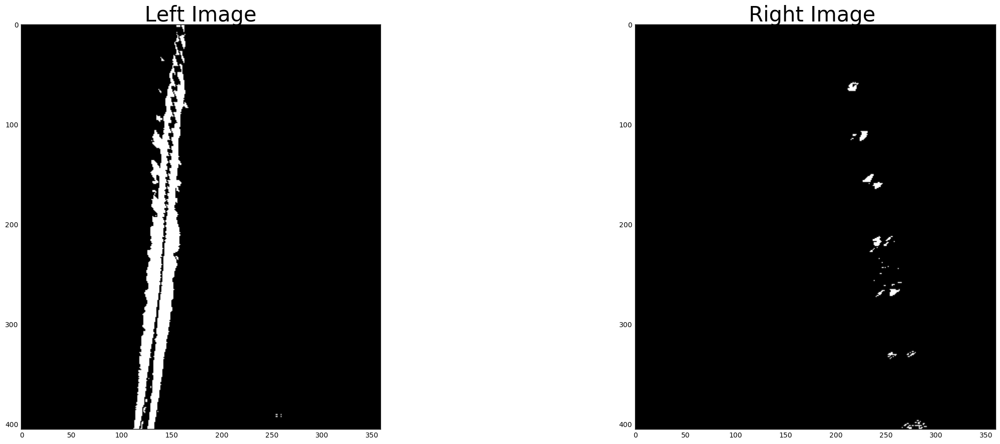

In [19]:
# split half half
img = combined
mid = int(img.shape[1]/2)
img_left = img[:,0:mid-1]
img_right = img[:,mid:1280]
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_left,cmap='gray')
ax1.set_title('Left Image', fontsize=30)
ax2.imshow(img_right, cmap='gray')
ax2.set_title('Right Image ', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

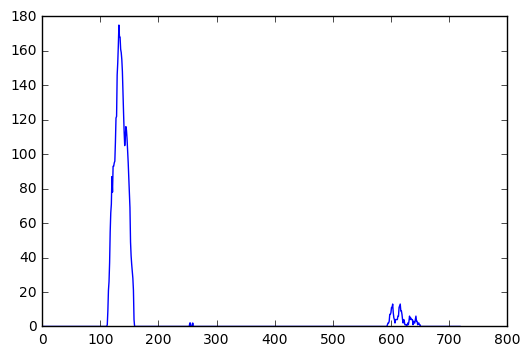

In [20]:
#https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/40ec78ee-fb7c-4b53-94a8-028c5c60b858/concepts/c41a4b6b-9e57-44e6-9df9-7e4e74a1a49a
import numpy as np
img = combined
histogram = np.sum(img[img.shape[0]/2:,:], axis=0)
plt.plot(histogram)

In [21]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Assuming you have created a warped binary image called "binary_warped"
# Take a histogram of the bottom half of the image
binary_warped=combined
histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
# Create an output image to draw on and  visualize the result
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

# Choose the number of sliding windows
nwindows = 9
# Set height of windows
window_height = np.int(binary_warped.shape[0]/nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = binary_warped.shape[0] - (window+1)*window_height
    win_y_high = binary_warped.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

(400, 0)

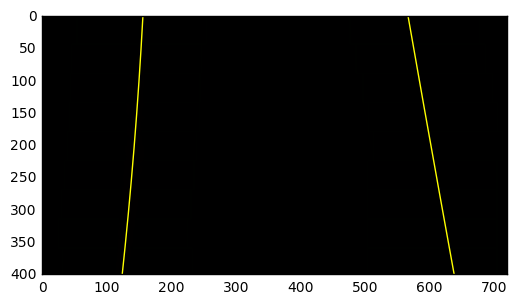

In [22]:
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0,720)
plt.ylim(400, 0)

In [23]:
# Assume you now have a new warped binary image 
# from the next frame of video (also called "binary_warped")
# It's now much easier to find line pixels!
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
margin = 100
left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

# Again, extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds]
# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

(400, 0)

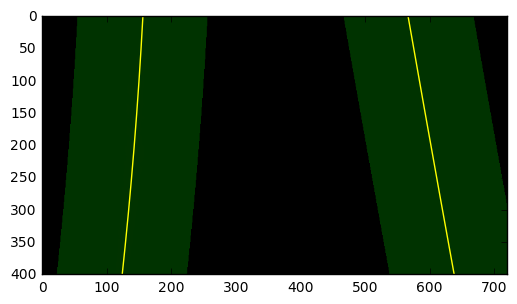

In [24]:
# Create an image to draw on and an image to show the selection window
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0,720)
plt.ylim(400, 0)

##### 6.    Determine the lane curvature

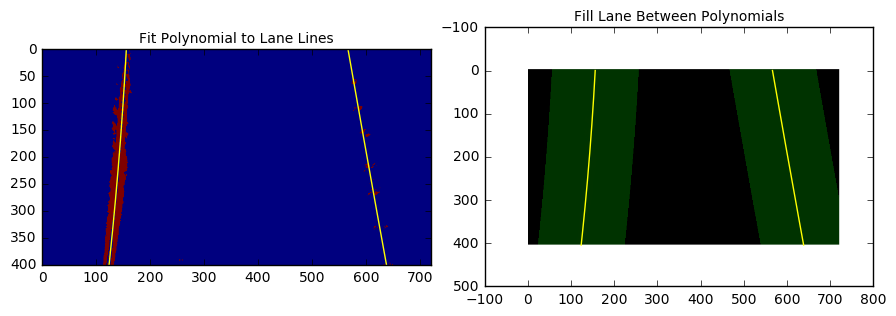

In [25]:
f, (ax1, ax2) = plt.subplots(1,2, figsize=(9, 6))
f.tight_layout()
ax1.imshow(combined)
ax1.set_xlim(0,720)
ax1.set_ylim(0,400)
ax1.plot(left_fitx, ploty, color='yellow')
ax1.plot(right_fitx, ploty, color='yellow')
ax1.set_title('Fit Polynomial to Lane Lines', fontsize=10)
ax1.invert_yaxis() # to visualize as we do the images
ax2.imshow(result)
ax2.plot(left_fitx, ploty, color='yellow')
ax2.plot(right_fitx, ploty, color='yellow')
ax2.set_title('Fill Lane Between Polynomials', fontsize=10)

(400, 0)

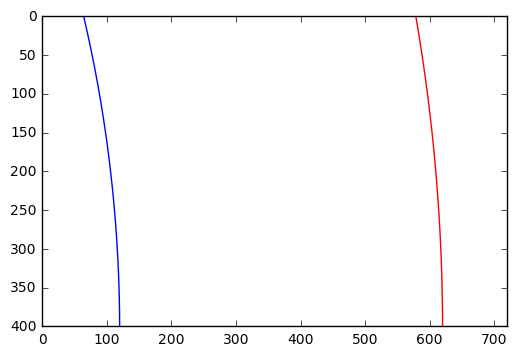

In [26]:
yvals = np.linspace(0, img.shape[0]-1, num=img.shape[0])
lxc = -1500
lradius = 1500
left_arcx = []
# Draw left arc, 500 pixels on image
lane_width = 500  
left_arcx_pt = 120+lxc+np.sqrt(lradius**2-(405-yvals)**2)
right_arcx_pt = 120+lxc+np.sqrt((lradius+lane_width)**2-(405-yvals)**2)

#print (left_arcx)
plt.plot(left_arcx_pt, yvals, color='blue')
plt.plot(right_arcx_pt, yvals, color='red')
plt.xlim(0, 720)
plt.ylim(400, 0)
#plt.ylim(0, 405

(405, 0)

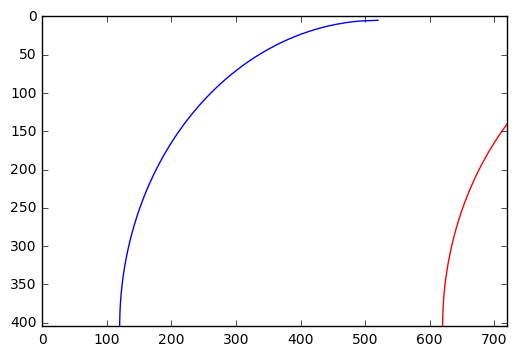

In [27]:
yvals = np.linspace(0, img.shape[0]-1, num=img.shape[0])
rxc = 400
radius = 400
# Draw left arc, 500 pixels on image
lane_width = 500  
right_arcx_pt = 120+lane_width+rxc-np.sqrt(radius**2-(405-yvals)**2)
left_arcx_pt = right_arcx_pt -lane_width
#    left_arcx.append(left_arcx_pt)

#print (left_arcx)
plt.plot(left_arcx_pt, yvals, color='blue')
plt.plot(right_arcx_pt, yvals, color='red')
plt.xlim(0, 720)
plt.ylim(405, 0)

In [28]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def left_right_lane(image):
    # above image is "combined" input
    # Take a histogram of the bottom half of the image
    histogram = np.sum(image[image.shape[0]/2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((image,image,image))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    #print(leftx_base, rightx_base)
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(image.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = image.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 80
    # Set minimum number of pixels found to recenter window
    minpix = 40
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = image.shape[0] - np.int((window+1)*window_height)
        win_y_high = image.shape[0] - np.int(window*window_height)
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    return leftx, lefty, rightx, righty, out_img

In [29]:
def c_radius(x1,y1,x2,y2,x3,y3):
    
    # source : http://www.intmath.com/applications-differentiation/8-radius-curvature.php
    m1 = (y2-y1)/(x2-x1)
    m2 = (y3-y2)/(x3-x2)
    
    xc = (m1*m2*(y1-y3)+m2*(x1+x2)-m1*(x2+x3))/(2*(m2-m1))
    yc = -(xc-(x1+x2)/2)/m1+(y1+y2)/2
    
    Radius = np.sqrt((x2-xc)*(x2-xc)+(y2-yc)*(y2-yc))
    
    return m1, m2, xc, yc, Radius

In [30]:
def pipeline(img):
    
    img = cv2.resize(img, (720, 405))
    apex, apey = 360, 258
    offset = 0
    offset_far = 50
    offset_near = 10
    src = np.float32([[int(apex-offset_far),apey],
                  [int(apex+offset_far),apey],
                  [int(0+offset_near),390],
                  [int(720-offset_near),390]])
    dst = np.float32([[0,0],[720,0],[0,405],[720,405]])
    #img = cv2.imread('test_images/straight_lines1.jpg')
    img = cv2.undistort(img, mtx, dist, None, mtx)
    img= cv2.GaussianBlur(img, (3,3), 0)
    img_size = (img.shape[1],img.shape[0])

    M = cv2.getPerspectiveTransform(src, dst)
    Mi = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, img_size)
    gray = cv2.cvtColor(warped, cv2.COLOR_BGR2GRAY)
    gradx = abs_sobel_thresh(warped, orient='x', sobel_kernel=3, thresh=(10, 230))
    grady = abs_sobel_thresh(warped, orient='y', sobel_kernel=3, thresh=(10, 230))
    mag_binary = mag_thresh(warped, sobel_kernel=ksize, mag_thresh=(30, 150))
    dir_binary = dir_threshold(warped, sobel_kernel=ksize, thresh=(0.7, 1.3))
    hls_binary = HLS_single(warped,thresh=(90, 255))
    image = np.zeros_like(dir_binary)
    image[((gradx == 1) & (hls_binary == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
          
    leftx, lefty, rightx, righty, out_img = left_right_lane(image)
        
    yvals = np.linspace(0, img.shape[0], num=img.shape[0])

    # Fit a second order polynomial to each lane line
    left_fit = np.polyfit(lefty, leftx, 2)
    left_fitx = left_fit[0]*yvals**2 + left_fit[1]*yvals + left_fit[2]
    right_fit = np.polyfit(righty, rightx, 2)
    right_fitx = right_fit[0]*yvals**2 + right_fit[1]*yvals + right_fit[2]

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/405 # meters per pixel in y dimension
    xm_per_pix = 3.7/600 # meteres per pixel in x dimension
    # Define y-value where we want radius of curvature
    # I'll choose 3 y-values(max, mean and min):
    y_eval = np.max(yvals)
    
    y_eval1 = np.max(yvals)
    y_eval2 = np.mean(yvals)
    y_eval3 = np.min(yvals)
    left_fitx_1 = left_fit[0]*y_eval1**2 + left_fit[1]*yvals + left_fit[2]
    left_fitx_2 = left_fit[0]*y_eval2**2 + left_fit[1]*yvals + left_fit[2]
    left_fitx_3 = left_fit[0]*y_eval3**2 + left_fit[1]*yvals + left_fit[2]
    right_fitx_1 = right_fit[0]*y_eval1**2 + right_fit[1]*yvals + right_fit[2]
    right_fitx_2 = right_fit[0]*y_eval2**2 + right_fit[1]*yvals + right_fit[2]
    right_fitx_3 = right_fit[0]*y_eval3**2 + right_fit[1]*yvals + right_fit[2]
    
    
    # Calculated the turning center point xc, yc and radius: 
            
    lm1, lm2, lxc, lyc, lradius = c_radius(left_fitx_1,y_eval1,left_fitx_2,y_eval2,left_fitx_3,y_eval3,)
    l_steering_angle = 4*360/lxc # assume xc <> 0, xc and radius value is very close, xc will show the direction as well
    
    
    rm1, rm2, rxc, ryc, rradius = c_radius(right_fitx_1,y_eval1,right_fitx_2,y_eval2,right_fitx_3,y_eval3,)
     
    r_steering_angle = 4*360/rxc # assume xc <> 0, xc and radius value is very close, xc will show the direction as well
    steering_angle = l_steering_angle + r_steering_angle
    turning_radius = (lradius+rradius)/2 # smooth out the radius
    
    # Find camera position
    left_mean = np.mean(leftx)
    right_mean = np.mean(rightx)
    camera_pos = (combined.shape[1]/2)-np.mean([left_mean, right_mean])

    left_fit_cr = np.polyfit(np.array(lefty,dtype=np.float32)*ym_per_pix, \
                         np.array(leftx,dtype=np.float32)*xm_per_pix, 2)
    right_fit_cr = np.polyfit(np.array(righty,dtype=np.float32)*ym_per_pix, \
                          np.array(rightx,dtype=np.float32)*xm_per_pix, 2)
    
    # Return radius of curvature is in meters
    
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval + left_fit_cr[1])**2)**1.5) \
                             /np.absolute(2*left_fit_cr[0])

    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval + right_fit_cr[1])**2)**1.5) \
                                /np.absolute(2*right_fit_cr[0])
      
    
    # Link all points for cv2.fillPoly() in pix space
    pts_left = np.array([np.transpose(np.vstack([left_fitx, yvals]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, yvals])))])
    pts = np.hstack((pts_left, pts_right))
    #pts_left = np.array([np.transpose(np.vstack([left_arcx_pt, yvals]))])
    #pts_right = np.array([np.flipud(np.transpose(np.vstack([right_arcx_pt, yvals])))])
    #pts = np.hstack((pts_left, pts_right))
    # pts = np.array([pts], dtype=np.int32)
    
    # Draw the lane onto the warped blank image
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    #color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    cv2.fillPoly(warp_zero, np.int_([pts]), (0,255, 0))
    cv2.polylines(warp_zero, np.array([pts_left], dtype=np.int32), False,(255,0,0),thickness = 15)
    cv2.polylines(warp_zero, np.array([pts_right], dtype=np.int32), False,(0,0,255),thickness = 15)
    font = cv2.FONT_HERSHEY_COMPLEX_SMALL
    
    cv2.putText(img,'Camera Position::{:.2f}m'.format(camera_pos*xm_per_pix),(10,30), font, 1,(255,255,255),2)
    cv2.putText(img,'Turning Radius::{}m'.format(camera_pos*xm_per_pix),(10,60), font, 1,(255,255,255),2)
    cv2.putText(img,'Steering Angle:]{:.6}deg'.format(str(steering_angle)),(10,90), font, 1,(255,255,255),2)
   
    # Warp back to original view
    unwarp =cv2.warpPerspective(warp_zero, Mi,img_size)
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, unwarp, 0.3, 0)
    #result = cv2.resize(result, (720, 405))

    return result

In [31]:
leftx, lefty, rightx, righty, out_img = left_right_lane(combined)
# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)
m1, m2, xc, yc, R = c_radius(1,1,2,3, 3,8)
print (m1, m2, xc, yc, R)

2.0 5.0 -10.833333333333334 8.166666666666668 13.834337313


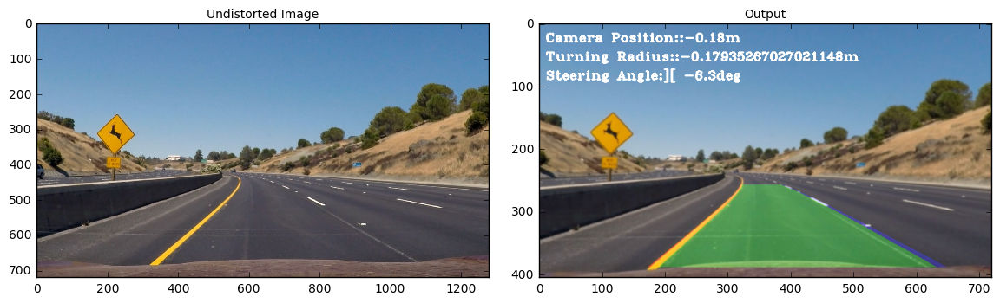

In [32]:
# Read in an image
image = mpimg.imread('test_images/test2.jpg')

result = pipeline(image)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Undistorted Image', fontsize=10)
ax2.imshow(result,cmap='gray' )
ax2.set_title('Output', fontsize=10)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [33]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

write_output = 'project_video_output.mp4'
clip1 = VideoFileClip("project_video.mp4")
write_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time write_clip.write_videofile(write_output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [01:38<00:00, 12.34it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 5min 8s, sys: 2.48 s, total: 5min 10s
Wall time: 1min 38s


In [34]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

write_output = 'challenge_video_output.mp4'
clip1 = VideoFileClip("challenge_video.mp4")
write_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time write_clip.write_videofile(write_output, audio=False)

[MoviePy] >>>> Building video challenge_video_output.mp4
[MoviePy] Writing video challenge_video_output.mp4


100%|██████████| 485/485 [00:40<00:00, 11.74it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_output.mp4 

CPU times: user 2min 10s, sys: 1.18 s, total: 2min 11s
Wall time: 41.1 s


In [35]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

write_output = 'harder_challenge_video_output.mp4'
clip1 = VideoFileClip("harder_challenge_video.mp4")
write_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time write_clip.write_videofile(write_output, audio=False)

[MoviePy] >>>> Building video harder_challenge_video_output.mp4
[MoviePy] Writing video harder_challenge_video_output.mp4


100%|█████████▉| 1199/1200 [01:48<00:00,  8.83it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_output.mp4 

CPU times: user 5min 41s, sys: 2.22 s, total: 5min 43s
Wall time: 1min 48s
